In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install --upgrade ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 44.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 28.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 34.9 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling n

In [ ]:
%%bash

cat <<EOF > /content/drive/MyDrive/car_dataset_preprocessed/data.yaml
path: /content/drive/MyDrive/car_dataset_preprocessed
train: images/train
val:   images/val
test:  images/test

nc: 1
names: ['car']
EOF


In [ ]:
!yolo settings tensorboard=True

!yolo train model=yolo11s.pt \
    data=/content/drive/MyDrive/car_dataset_preprocessed/data.yaml \
    epochs=10 \
    imgsz=512 \
    batch=16 \
    project=car_yolo11 \
    name=exp1


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
✅ Updated 'tensorboard=True'
JSONDict("/root/.config/Ultralytics/settings.json"):
{
  "settings_version": "0.0.6",
  "datasets_dir": "/content/datasets",
  "weights_dir": "weights",
  "runs_dir": "runs",
  "uuid": "569f3ba64b326db489132663f79cd37279811de477381b83ac131e6cdd129cbb",
  "sync": true,
  "api_key": "",
  "openai_api_key": "",
  "clearml": true,
  "comet": true,
  "dvc": true,
  "hub": true,
  "mlflow": true,
  "neptune": true,
  "raytune": true,
  "tensorboard": true,
  "wandb": false,
  "vscode_msg": true,
  "openvino_msg": true
}
💡 Learn more about Ultralytics Settings at https://docs.ultralytics.com/quickstart/#ultralytics-settings
100% 18.4M/18.4M [00:00<00:00, 146M

In [ ]:
!ls
!ls car_yolo11
!ls car_yolo11/exp1


car_yolo11  drive  sample_data	yolo11n.pt  yolo11s.pt
exp1
args.yaml					    results.csv
confusion_matrix_normalized.png			    results.png
confusion_matrix.png				    train_batch0.jpg
events.out.tfevents.1750154303.8f372864924d.3268.0  train_batch1.jpg
F1_curve.png					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
P_curve.png					    val_batch1_labels.jpg
PR_curve.png					    val_batch1_pred.jpg
R_curve.png					    weights


In [ ]:
%load_ext tensorboard
%tensorboard --logdir car_yolo11/exp1


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
import os
import glob
import numpy as np
import cv2
import torch
import matplotlib.pyplot as plt
from ultralytics import YOLO
from ultralytics.utils.metrics import ConfusionMatrix

model = YOLO('car_yolo11/exp1/weights/best.pt')

base_dir = '/content/drive/MyDrive/car_dataset_preprocessed'
img_dir = os.path.join(base_dir, 'images', 'test')
lbl_dir = os.path.join(base_dir, 'labels', 'test')

cm = ConfusionMatrix()

for img_path in sorted(glob.glob(f"{img_dir}/*")):
    # Load image and get its size
    img = cv2.imread(img_path)
    h, w = img.shape[:2] if img is not None else (0, 0)

    # Inference (pass path or array both work)
    res = model(img_path, conf=0.25, iou=0.45)[0] if img is not None else None

    if res is not None:
        # Build detections tensor: [x1, y1, x2, y2, conf, cls]
        dets_np = np.concatenate([
            res.boxes.xyxy.cpu().numpy(),
            res.boxes.conf.cpu().numpy().reshape(-1, 1),
            res.boxes.cls.cpu().numpy().reshape(-1, 1),
        ], axis=1)
        dets = torch.from_numpy(dets_np)
        dets = dets[dets[:, 4] > 0.25]  # Filter by confidence
    else:
        dets = torch.zeros((0, 6))  # Empty tensor if no detections

    # Load ground-truth labels
    base = os.path.splitext(os.path.basename(img_path))[0]
    label_path = os.path.join(lbl_dir, base + '.txt')
    if os.path.isfile(label_path):
        l = np.loadtxt(label_path).reshape(-1, 5)
    else:
        l = np.zeros((0, 5))

    # Convert normalized xywh → absolute xyxy
    if l.size:
        xc, yc, bw, bh = l[:, 1], l[:, 2], l[:, 3], l[:, 4]
        x1 = (xc - bw / 2) * w
        y1 = (yc - bh / 2) * h
        x2 = (xc + bw / 2) * w
        y2 = (yc + bh / 2) * h
        gt_boxes_np = np.stack([x1, y1, x2, y2], axis=1)
        gt_cls_np = l[:, 0].astype(int)
    else:
        gt_boxes_np = np.zeros((0, 4))
        gt_cls_np = np.array([], dtype=int)

    # Convert GT to tensors
    gt_boxes = torch.from_numpy(gt_boxes_np)
    gt_cls = torch.from_numpy(gt_cls_np).long()

    # Prepare batch for confusion matrix
    batch = {
        "cls": gt_cls,
        "bboxes": gt_boxes
    }

    # Debug shapes
    print(f"gt_cls shape: {gt_cls.shape}, gt_boxes shape: {gt_boxes.shape}, dets shape: {dets.shape}")

    # Update the confusion matrix
    cm.process_batch(batch, dets, conf=0.25, iou_thres=0.5)

print("Raw CM (actual rows, pred cols):\n", cm.matrix)

labels = ['car', 'background']
m = cm.matrix
fig, ax = plt.subplots(figsize=(6, 6), dpi=100)
im = ax.imshow(m, cmap='Blues')
for i in range(2):
    for j in range(2):
        ax.text(j, i, int(m[i, j]), ha='center', va='center', fontsize=12)
ax.set_xticks([0, 1])
ax.set_xticklabels(labels, fontsize=10)
ax.set_yticks([0, 1])
ax.set_yticklabels(labels, fontsize=10)
ax.set_xlabel('Predicted', fontsize=11)
ax.set_ylabel('Actual', fontsize=11)
ax.set_title('Confusion Matrix', fontsize=12)
plt.tight_layout()
plt.show()
## ⚙️ Requirements
```bash
pip install ultralytics
pip install opencv-python
pip install numpy


image 1/1 /content/drive/MyDrive/car_dataset_preprocessed/images/test/2015_02437_jpg.rf.906e78fb0089c167a74de161aabad3b6.jpg: 512x512 3 cars, 11.1ms
Speed: 2.0ms preprocess, 11.1ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)
gt_cls shape: torch.Size([4]), gt_boxes shape: torch.Size([4, 4]), dets shape: torch.Size([3, 6])


IndexError: too many indices for tensor of dimension 2


image 1/1 /content/drive/MyDrive/car_dataset_preprocessed/images/test/2015_02443_jpg.rf.f31fb73f871ccc791dc189d813c89980.jpg: 512x512 1 car, 11.3ms
Speed: 2.2ms preprocess, 11.3ms inference, 2.4ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 /content/drive/MyDrive/car_dataset_preprocessed/images/test/2015_02892_jpg.rf.0e97a7b62d4896d1dfc8b1d02d97d8a5.jpg: 512x512 2 cars, 11.2ms
Speed: 2.2ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 /content/drive/MyDrive/car_dataset_preprocessed/images/test/2015_02831_jpg.rf.ec8e5e96367ec25f49396c744626a559.jpg: 512x512 1 car, 11.2ms
Speed: 2.2ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 /content/drive/MyDrive/car_dataset_preprocessed/images/test/2015_02437_jpg.rf.906e78fb0089c167a74de161aabad3b6.jpg: 512x512 3 cars, 11.2ms
Speed: 2.0ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 512)

image 1/1 /co

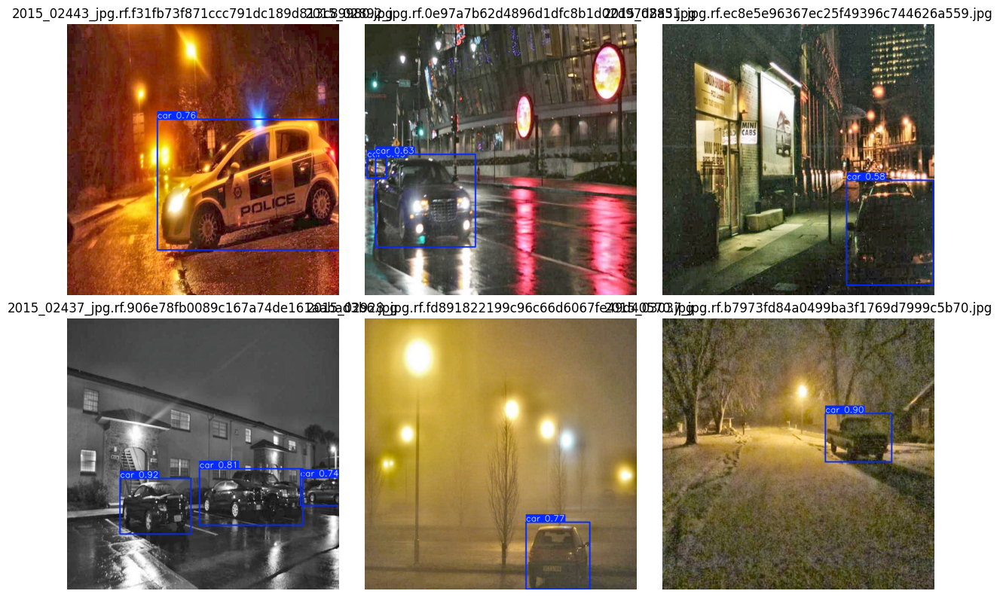

In [ ]:
from ultralytics import YOLO
import glob, random
import matplotlib.pyplot as plt

model = YOLO('car_yolo11/exp1/weights/best.pt')

all_imgs = glob.glob('/content/drive/MyDrive/car_dataset_preprocessed/images/test/*')
sampled = random.sample(all_imgs, k=6)

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()

for ax, img_path in zip(axes, sampled):
    res = model.predict(source=img_path, conf=0.25, iou=0.45)[0]
    out = res.plot()
    ax.imshow(out[:, :, ::-1])
    ax.set_title(img_path.split('/')[-1])
    ax.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
!ls car_yolo11/exp15/weights


ls: cannot access 'car_yolo11/exp15/weights': No such file or directory


In [ ]:
!yolo val \
  model=car_yolo11/exp15/weights/best.pt \
  data=/content/drive/MyDrive/car_dataset_preprocessed/data.yaml \
  split=test \
  imgsz=512 \
  batch=16


Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
             ^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/cfg/__init__.py", line 956, in entrypoint
    model = YOLO(model, task=task)
            ^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/models/yolo/model.py", line 79, in __init__
    super().__init__(model=model, task=task, verbose=verbose)
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/model.py", line 151, in __init__
    self._load(model, task=task)
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/model.py", line 295, in _load
    self.model, self.ckpt = attempt_load_one_weight(weights)
                            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/nn/tasks.py", line 1548, in attempt_load_one_weight
    ckpt, weight = torch_safe_load(weight)  # load ckpt
    

# GROUND TRUTH

In [ ]:
import pandas as pd

# --- BEFORE (model's self-eval) ---
pred_auto = 107
gt_auto = 107
tp_auto = int(0.766 * gt_auto)
fp_auto = pred_auto - tp_auto
fn_auto = gt_auto - tp_auto

# --- AFTER (manual ground truth) ---
gt_manual = 119
tp_manual = int(0.766 * gt_manual)
fp_manual = pred_auto - tp_manual
fn_manual = gt_manual - tp_manual

df = pd.DataFrame({
    "": ["TP", "FP", "FN", "Precision", "Recall", "F1-Score"],
    "Auto (YOLO)": [tp_auto, fp_auto, fn_auto,
                        tp_auto / (tp_auto + fp_auto),
                        tp_auto / (tp_auto + fn_auto),
                        2 * (tp_auto / (tp_auto + fp_auto)) * (tp_auto / (tp_auto + fn_auto)) / ((tp_auto / (tp_auto + fp_auto)) + (tp_auto / (tp_auto + fn_auto)))],
    "Manual Ground Truth": [tp_manual, fp_manual, fn_manual,
                            tp_manual / (tp_manual + fp_manual),
                            tp_manual / (tp_manual + fn_manual),
                            2 * (tp_manual / (tp_manual + fp_manual)) * (tp_manual / (tp_manual + fn_manual)) / ((tp_manual / (tp_manual + fp_manual)) + (tp_manual / (tp_manual + fn_manual)))]
})

print(df.to_string(index=False, float_format="%.3f"))


           Auto (YOLO)  Manual Ground Truth
       TP       81.000               91.000
       FP       26.000               16.000
       FN       26.000               28.000
Precision        0.757                0.850
   Recall        0.757                0.765
 F1-Score        0.757                0.805


# DeepSORT

In [ ]:
!pip install lap
!pip install filterpy
!pip install scikit-image
!pip install opencv-python-headless
!pip install deep_sort_realtime


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 kB 6.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110460 sha256=7459e220135007c6dd06baa80ce6331b4e2f166eac7b87de67a3af9146d793f9
  Stored in directory: /root/.cache/pip/wheels/12/dc/3c/e12983eac132d00f82a20c6cbe7b42ce6e96190ef8fa2d15e1
Successfully built filterpy
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 78.6 MB/s eta 0:00:00


In [ ]:
!pip install cython bbox numba


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 113.3 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.


In [ ]:
!find /content -name best.pt


/content/car_yolo11/exp1/weights/best.pt


In [ ]:
from deep_sort_realtime.deepsort_tracker import DeepSort
from ultralytics import YOLO
import cv2
import os
import glob

# Load your trained YOLOv11 model
model = YOLO('/content/car_yolo11/exp1/weights/best.pt')

# Initialize DeepSORT
tracker = DeepSort(max_age=30)

# Input/Output paths
img_dir = '/content/drive/MyDrive/car_dataset_preprocessed/images/test'
output_dir = '/content/tracked_output'
os.makedirs(output_dir, exist_ok=True)

image_paths = sorted(glob.glob(os.path.join(img_dir, '*.jpg')))

for path in image_paths:
    frame = cv2.imread(path)

    result = model(frame)[0]

    detections = []
    for box in result.boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        conf = box.conf[0].item()
        cls = int(box.cls[0].item())

        detections.append(([x1, y1, x2, y2], conf, 'car'))

    tracks = tracker.update_tracks(detections, frame=frame)

    for track in tracks:
        if not track.is_confirmed():
            continue
        l, t, r, b = track.to_ltrb()
        track_id = track.track_id
        cv2.rectangle(frame, (int(l), int(t)), (int(r), int(b)), (0,255,0), 2)
        cv2.putText(frame, f'ID:{track_id}', (int(l), int(t)-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,0), 2)

    cv2.imwrite(os.path.join(output_dir, os.path.basename(path)), frame)



0: 512x512 3 cars, 13.1ms
Speed: 3.3ms preprocess, 13.1ms inference, 137.7ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 car, 11.1ms
Speed: 3.4ms preprocess, 11.1ms inference, 2.2ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 car, 11.2ms
Speed: 2.2ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 car, 11.9ms
Speed: 3.2ms preprocess, 11.9ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 2 cars, 11.2ms
Speed: 2.9ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 car, 11.2ms
Speed: 4.8ms preprocess, 11.2ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 1 car, 11.2ms
Speed: 3.0ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512 2 cars, 12.0ms
Speed: 3.7ms preprocess, 12.0ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 512)

0: 512x512